In [9]:
from datasets.load import load_samples
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

%matplotlib inline
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots
#plt.rcParams['image.interpolation'] = 'nearest'
#plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
samples = load_samples('train', 'datasets')

[{'name': 'wenda', 'bounds': [[2372, 5368, 2533, 5830]]}, {'name': 'waldo', 'bounds': [[3795, 1238, 4072, 1676], [1525, 561, 1964, 1053]]}]


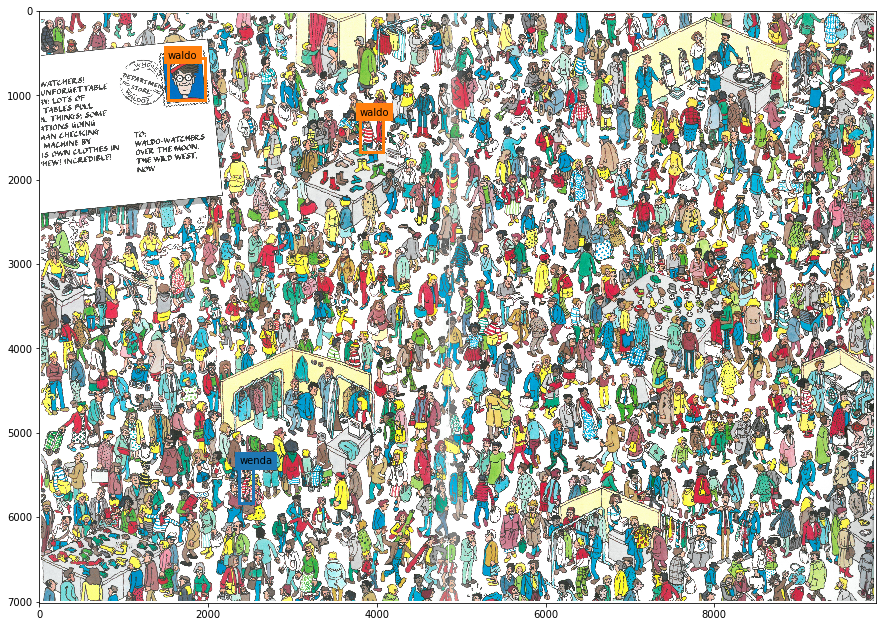

[{'name': 'waldo', 'bounds': [[1779, 4188, 1854, 4368]]}, {'name': 'wizard', 'bounds': [[4594, 2070, 4764, 2295]]}]


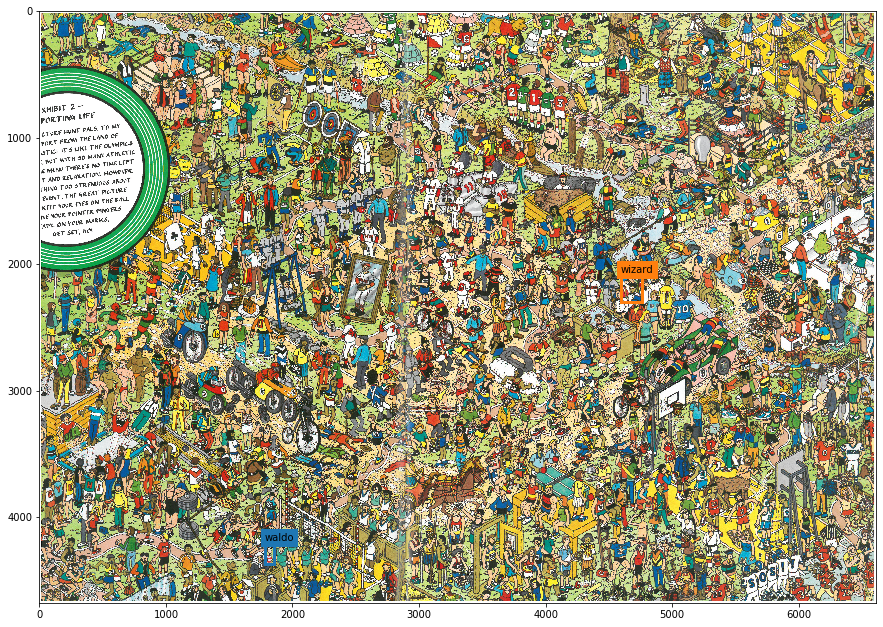

[{'name': 'waldo', 'bounds': [[1448, 814, 1856, 1230], [3888, 5214, 3988, 5407]]}, {'name': 'wenda', 'bounds': [[8253, 1856, 8402, 2114]]}, {'name': 'wizard', 'bounds': [[2574, 1674, 2772, 2179]]}]


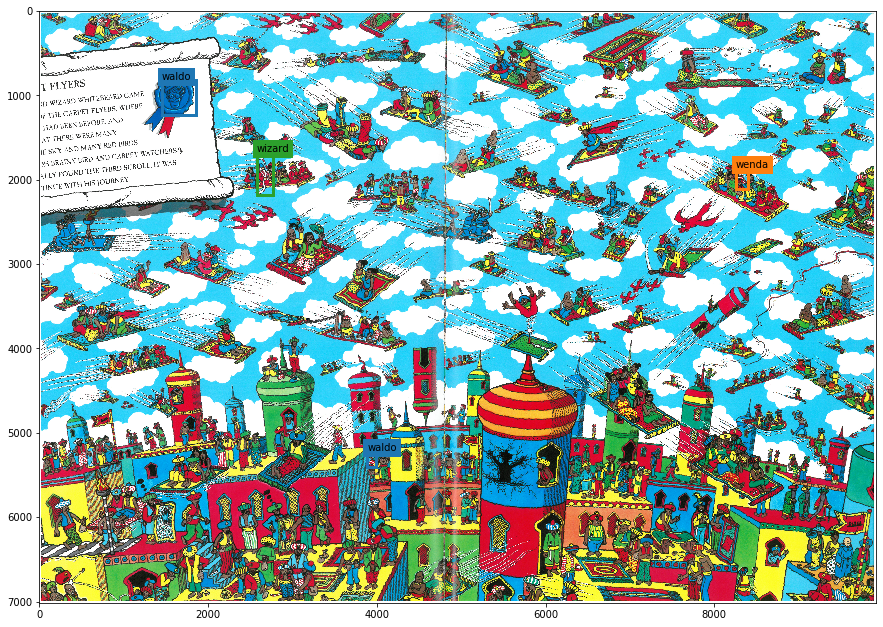

[{'name': 'waldo', 'bounds': [[2217, 1220, 2254, 1303], [547, 100, 644, 217]]}]


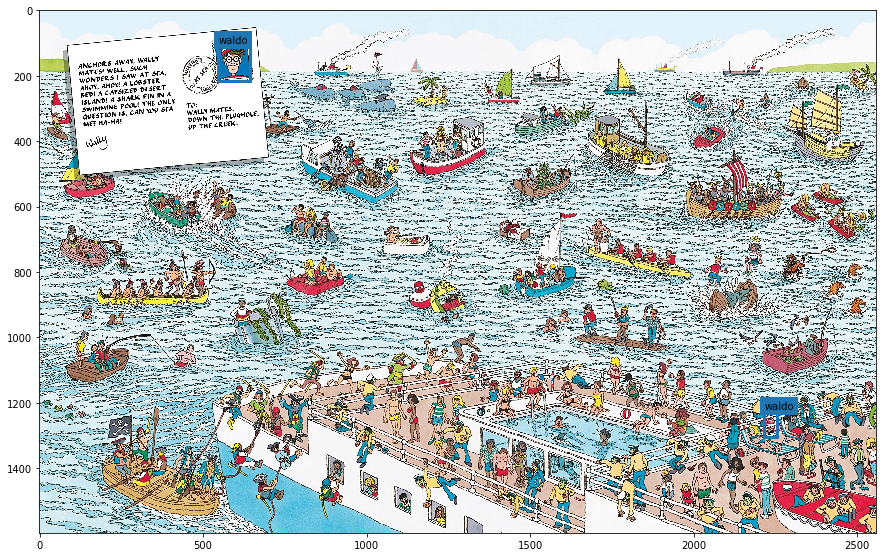

[{'name': 'waldo', 'bounds': [[2140, 1376, 2270, 1656]]}, {'name': 'wenda', 'bounds': [[4567, 3815, 4644, 4055]]}, {'name': 'wizard', 'bounds': [[2454, 725, 2594, 985]]}]


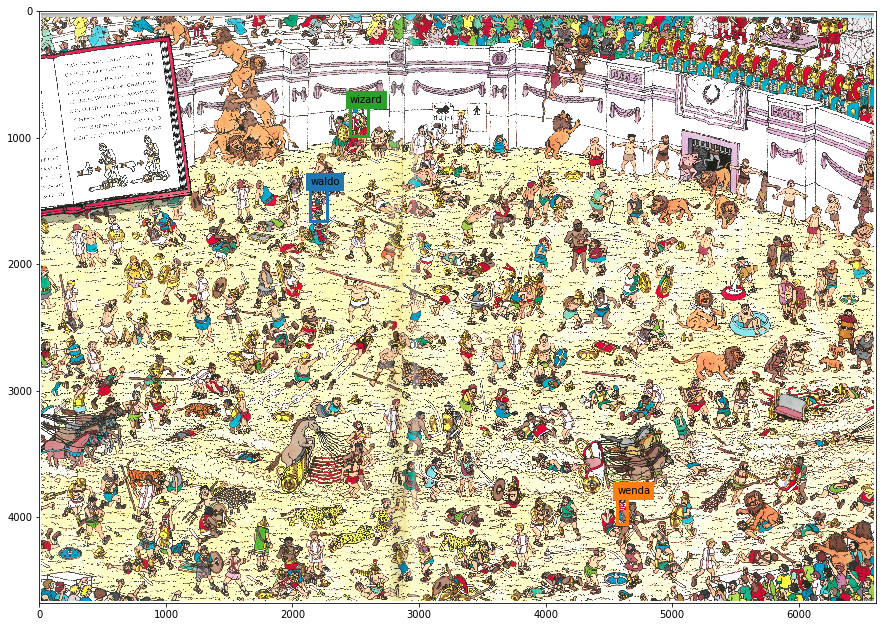

In [25]:
def draw_bbox(ax, name, box, col='r'):
    r = patches.Rectangle((box[0], box[1]), 
                          box[2] - box[0],
                          box[3] - box[1],
                          linewidth=3,
                          edgecolor=col,
                          facecolor='none')
    ax.add_patch(r)
    ax.text(box[0], box[1], name,
            bbox={'facecolor': col, 'linewidth': 0})

def draw_annotation(ax, classes):
    colors = plt.get_cmap('tab10')
    for idx, cl in enumerate(classes):
        col = colors(idx)
        for box in cl['bounds']:
            draw_bbox(ax, cl['name'], box, col)

for sample in np.random.choice(samples, 5, replace=False):
    fig, ax = plt.subplots(1)
    ax.imshow(sample['img'])
    print(sample['classes'])
    draw_annotation(ax, sample['classes'])
    plt.show()

In [38]:
import math
def generate_pos_samples(samples, blowup=1):
    res = []
    for sample in samples:
        for cl in sample['classes']:
            for box in cl['bounds']:
                scales = np.random.uniform(low=1, high=10, size=(blowup,))
                for s in scales:
                    try:
                        ymin, ymax = box[1], box[3]
                        xmin, xmax = box[0], box[2]
                        sx = math.ceil((ymax - ymin)*s/2)
                        sy = math.ceil((xmax - xmin)*s/2)
                        ymin, ymax = ymin - sy, ymax + sy
                        xmin, xmax = xmin - sy, xmax + sy
                        
                        img = sample['img'][ymin:ymax, xmin:xmax]
                        if img.size != 0:
                            #print(img)
                            res.append(dict(
                                name = cl['name'],
                                img = img,
                                scale = 1/s,
                                bbox = [box[0] - xmin,
                                        box[1] - ymin,
                                        box[2] - xmin,
                                        box[3] - ymin]                             
                            ))
                    except Exception as e:
                        print(e)
    np.random.shuffle(res)
    return res

pos_samples = generate_pos_samples(samples, 5)

num samples: 62
num scaled samples: 675


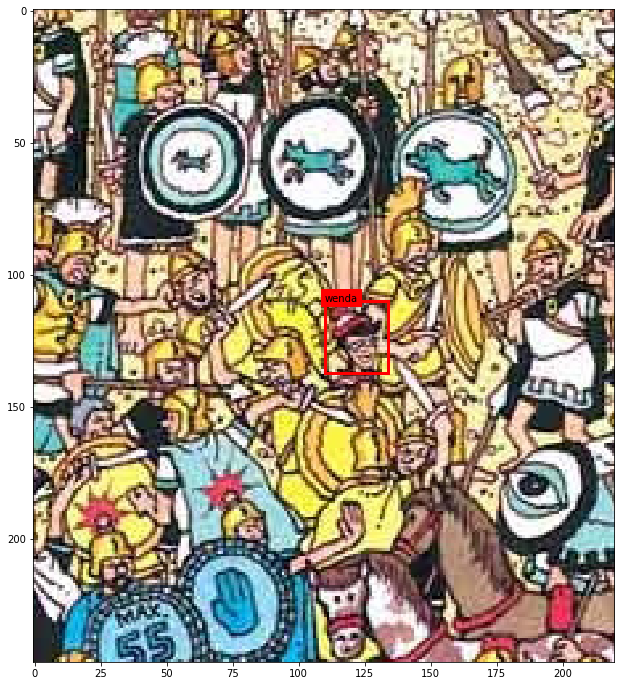

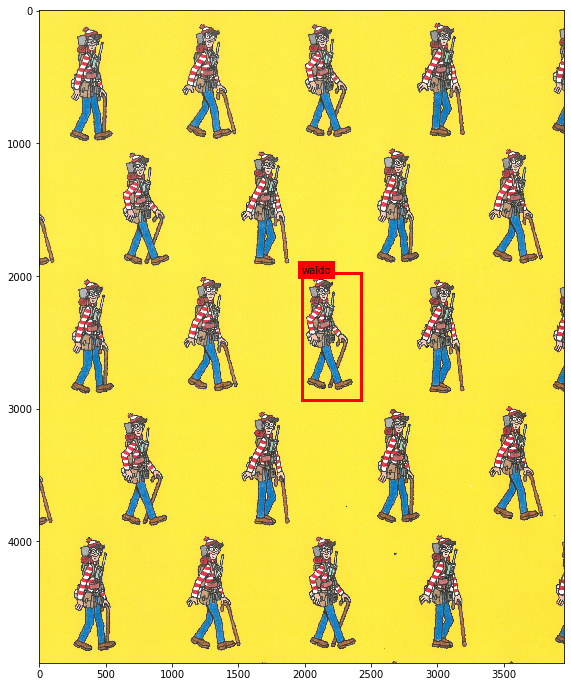

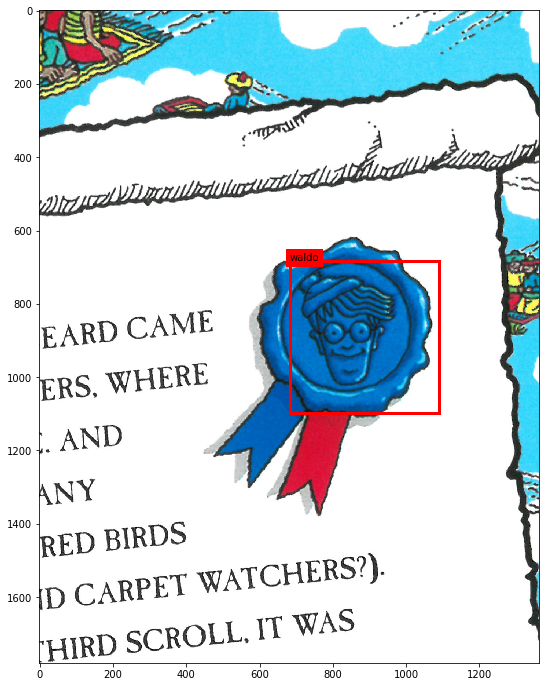

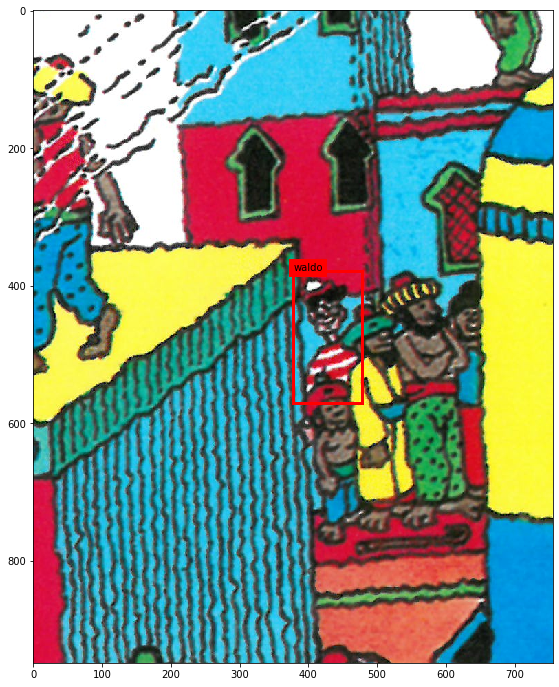

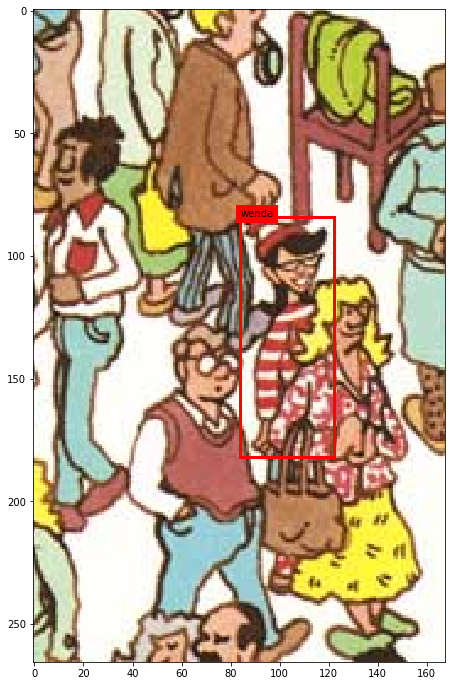

In [39]:
print('num samples: {}'.format(len(samples)))
print('num scaled samples: {}'.format(len(pos_samples)))


for idx, sample in enumerate(np.random.choice(pos_samples, 5, replace=False)):
    fig, ax = plt.subplots(1)
    plt.imshow(sample['img'])
    draw_bbox(ax, sample['name'], sample['bbox'])
    
plt.show()